# **The Anatomy of Stable Diffusion**

Stable Diffusion is a powerful text-to-image model capable of generating detailed images based on text descriptions. While libraries like `diffusers` make using it incredibly easy, they often treat the model as a "black box." To truly master generative deep learning, one must understand the interacting components that make this magic possible.

The code snippet below demonstrates how the high-level API abstracts away the complexity, generating an image with just a few lines of code:

```python
from diffusers import StableDiffusionPipeline
import torch

# Initialize the pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    variant="fp16",
    torch_dtype=torch.float16,
    use_auth_token=True
).to("cuda")

# Generate an image
image = pipe("An astronaut scuba diving").images[0]
```

In this notebook, we will deconstruct this pipeline to understand exactly what happens under the hood. We will move beyond the "black box" by manually assembling the generation loop and inspecting the specific roles of the **VAE, UNet, and Scheduler**.

Once we have control over the raw components, we will explore advanced manipulation techniques: **hacking text embeddings** to mix concepts, implementing **custom loss guidance** to enforce specific visual properties, and finally, analyzing the **geometry of the high-dimensional latent space** to understand why spherical interpolation (SLERP) is superior to linear methods.

<br/>

## 1. **Setup & Imports**



In [ ]:
!pip install --upgrade transformers diffusers accelerate ftfy

In [ ]:
from huggingface_hub import login

# Authenticate with Hugging Face using your provided token
# This allows us to download the model weights automatically
login(token="")

In [3]:
import os
import warnings
from pathlib import Path
from base64 import b64encode
import numpy as np
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from IPython.display import HTML

# PyTorch & Diffusers
import torch
from torch import autocast
from torchvision import transforms as tfms
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel
from transformers import CLIPTextModel, CLIPTokenizer, logging

# 1. Configuration
# Suppress specific warnings to keep the output clean
warnings.filterwarnings("ignore")
logging.set_verbosity_error()

# Set random seed for reproducibility
torch.manual_seed(1)

# 2. Device Setup
# Automatically select CUDA (NVIDIA), MPS (Mac M1/M2), or CPU
torch_device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
if "mps" == torch_device:
    os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = "1"

print(f"Using device: {torch_device}")

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Using device: cuda


## 2. **Loading the Pretrained Models**

In this section, we set up the core components of the Stable Diffusion pipeline. Unlike the high-level `StableDiffusionPipeline` used earlier, we will load each model individually to understand its specific role:

1.  **Autoencoder (VAE):** Decodes the latent representations back into visual images.
2.  **Tokenizer & Text Encoder (CLIP):** Prepares and encodes the text prompts into embeddings that the UNet can understand.
3.  **UNet:** The primary diffusion model that generates the latent representation by predicting noise residuals.
4.  **Scheduler:** Manages the noise schedule (adding and removing noise) during the diffusion process.

We will use the pre-trained weights from `CompVis/stable-diffusion-v1-4` for the diffusion components and `openai/clip-vit-large-patch14` for the text encoding.

In [ ]:
from diffusers import AutoencoderKL, UNet2DConditionModel, LMSDiscreteScheduler
from transformers import CLIPTokenizer, CLIPTextModel
import torch

# Model Hub IDs
SD_MODEL_ID = "CompVis/stable-diffusion-v1-4"
CLIP_MODEL_ID = "openai/clip-vit-large-patch14"

# 1. Load the Autoencoder (VAE)
vae = AutoencoderKL.from_pretrained(
    SD_MODEL_ID, subfolder="vae", torch_dtype=torch.float16
)

# 2. Load the Tokenizer and Text Encoder
tokenizer = CLIPTokenizer.from_pretrained(CLIP_MODEL_ID)
text_encoder = CLIPTextModel.from_pretrained(
    CLIP_MODEL_ID, torch_dtype=torch.float16
)

# 3. Load the UNet
unet = UNet2DConditionModel.from_pretrained(
    SD_MODEL_ID, subfolder="unet", torch_dtype=torch.float16
)

# 4. Initialize the Noise Scheduler
# beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000
scheduler = LMSDiscreteScheduler(
    beta_start=0.00085,
    beta_end=0.012,
    beta_schedule="scaled_linear",
    num_train_timesteps=1000,
)

# To the GPU we go
if vae is not None:
    vae = vae.to(torch_device)
    text_encoder = text_encoder.to(torch_device)
    unet = unet.to(torch_device)

# Extra memory safety
vae.eval()
text_encoder.eval()
unet.eval()

# Optional: memory-efficient attention (if available)
try:
    unet.enable_xformers_memory_efficient_attention()
except Exception:
    pass


## 3. **The Diffusion Loop**

In this cell, we are performing the core text-to-image generation using Stable Diffusion. The procedure follows these steps:
1.  **Preparation:** Takes a text prompt and converts it into embeddings.
2.  **Initialization:** Generates an initial noisy latent representation.
3.  **Denoising:** Iteratively denoises the latents through the UNet model.
4.  **Decoding:** Decodes the final latent representation into a real image using the VAE.

This process implements diffusion-based image generation, starting from random noise and gradually refining it to match the input prompt.

  0%|          | 0/30 [00:00<?, ?it/s]

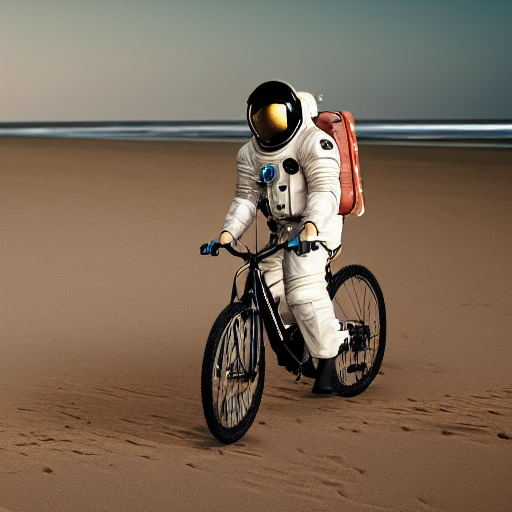

In [ ]:
import gc
import torch
from tqdm.auto import tqdm
from PIL import Image
from IPython.display import display
from torch.cuda.amp import autocast  # <-- this autocast takes NO "cuda" argument

# Free any leftover cached memory from earlier cells/runs
gc.collect()
torch.cuda.empty_cache()

# 1. Settings
prompt = ["a cinematic photo of an astronaut riding a bike in beach, ultra detailed"]  
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 30            
guidance_scale = 7.5                
generator = torch.Generator(device=torch_device).manual_seed(42)  
batch_size = 1

# 2. Prep text
text_inputs = tokenizer(
    prompt,
    padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)
text_input_ids = text_inputs.input_ids.to(torch_device)
cond_embeddings = text_encoder(text_input_ids)[0]

uncond_inputs = tokenizer(
    [""] * batch_size,
    padding="max_length",
    max_length=tokenizer.model_max_length,
    return_tensors="pt",
)
uncond_input_ids = uncond_inputs.input_ids.to(torch_device)
uncond_embeddings = text_encoder(uncond_input_ids)[0]

# Keep this variable name (structure preserved)
text_embeddings = None  # (we use cond_embeddings + uncond_embeddings directly to save memory)

# 3. Prep Scheduler
def set_timesteps(scheduler, num_inference_steps):
    scheduler.set_timesteps(num_inference_steps)
    # Minor fix to ensure MPS compatibility, fixed in diffusers PR 3925
    scheduler.timesteps = scheduler.timesteps.to(torch.float32)

set_timesteps(scheduler, num_inference_steps)

# 4. Prep latents
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=generator,
    device=torch_device,
    dtype=torch.float16,  # fp16 saves VRAM
)
latents = latents * scheduler.init_noise_sigma

# 5. The Loop
with torch.no_grad():
    with autocast():  # <-- IMPORTANT: torch.cuda.amp.autocast() takes no device string
        for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
            # latent_model_input = ...
            # (memory-friendly: DO NOT concatenate; do two passes instead)
            latent_model_input = latents

            # latent_model_input = scheduler.scale_model_input(...)
            latent_model_input = scheduler.scale_model_input(latent_model_input, t)

            # noise_pred = ...
            if guidance_scale is not None and guidance_scale > 1.0:
                noise_pred_uncond = unet(
                    latent_model_input, t, encoder_hidden_states=uncond_embeddings
                ).sample
                noise_pred_text = unet(
                    latent_model_input, t, encoder_hidden_states=cond_embeddings
                ).sample
                noise_pred = noise_pred_uncond + guidance_scale * (
                    noise_pred_text - noise_pred_uncond
                )
            else:
                noise_pred = unet(
                    latent_model_input, t, encoder_hidden_states=cond_embeddings
                ).sample

            # Split noise_pred into uncond and text components and apply guidance_scale
            # (handled above)

            # latents = scheduler.step(...)
            latents = scheduler.step(noise_pred, t, latents).prev_sample

# 6. Decode and Display
latents = latents / vae.config.scaling_factor
image = vae.decode(latents).sample

# Display logic
if image is not None:
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    display(pil_images[0])


It's working, but that's quite a bit of code! Let's look at the components one by one.

## 4. **The Autoencoder (VAE)**

The Variational Autoencoder (VAE) can encode an image into some sort of latent representation, and decode this back into an image. In this cell you should define two helper functions that convert between PIL images and Stable Diffusion latents, allowing you to move seamlessly between image space and the model’s latent space. Latents are the internal compressed representations that the VAE uses to generate or manipulate images. These functions are essential when you want to perform image-to-image tasks, edits, or latent-space manipulations.

In [ ]:
import torch
import numpy as np
from PIL import Image
from torchvision import transforms

def pil_to_latent(input_im):
    # 1. Convert PIL image to Tensor and add a batch dimension.
    # 2. Scale the pixel values to [-1, 1] and move to the device.
    # 3. Encode the image using the VAE and sample from the distribution.
    # 4. Scale the result by the scaling factor (0.18215).
    if not isinstance(input_im, Image.Image):
        raise TypeError("input_im must be a PIL.Image.Image")

    preprocess = transforms.Compose([
        transforms.ToTensor(),  # [0,1], (C,H,W)
    ])

    image = preprocess(input_im).unsqueeze(0)                 # (1,C,H,W)
    image = image * 2.0 - 1.0                                 # [-1,1]
    image = image.to(device=torch_device, dtype=torch.float16)

    with torch.no_grad():
        latents_dist = vae.encode(image).latent_dist
        latents = latents_dist.sample(generator=None)         # (1,4,H/8,W/8)

    latents = latents * vae.config.scaling_factor             # ~0.18215
    return latents

def latents_to_pil(latents):
    # 1. Scale the latents by the inverse of the scaling factor (1 / 0.18215).
    # 2. Decode the latents using the VAE.
    # 3. Normalize the result to [0, 1] and clamp values.
    # 4. Convert to Numpy (H, W, C) and then to a list of PIL images.
    if not torch.is_tensor(latents):
        raise TypeError("latents must be a torch.Tensor")

    latents = latents.to(device=torch_device, dtype=torch.float16)

    with torch.no_grad():
        latents = latents / vae.config.scaling_factor
        image = vae.decode(latents).sample                   # (B,3,H,W)

    image = (image / 2 + 0.5).clamp(0, 1)                    # [0,1]
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy() # (B,H,W,C)
    images = (image * 255).round().astype("uint8")

    pil_images = [Image.fromarray(img) for img in images]
    return pil_images


### 4.1. **Visualizing the Latent Space**

We will use a demo image (or you can use your image), encode it into the latent space, visualize the compressed channels, and then decode it back to see how well the VAE reconstructed the original image.

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 58602  100 58602    0     0   603k      0 --:--:-- --:--:-- --:--:--  608k


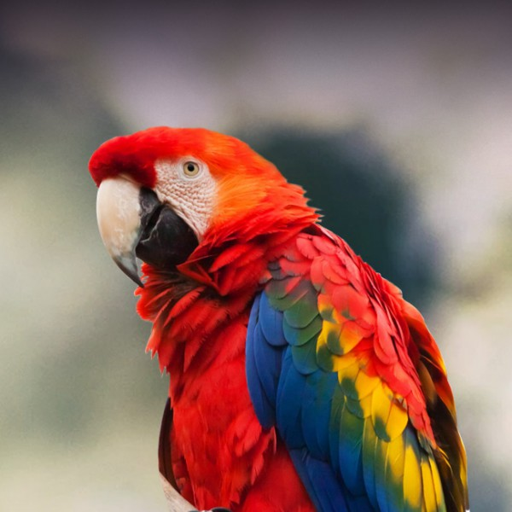

Latent shape: torch.Size([1, 4, 64, 64])


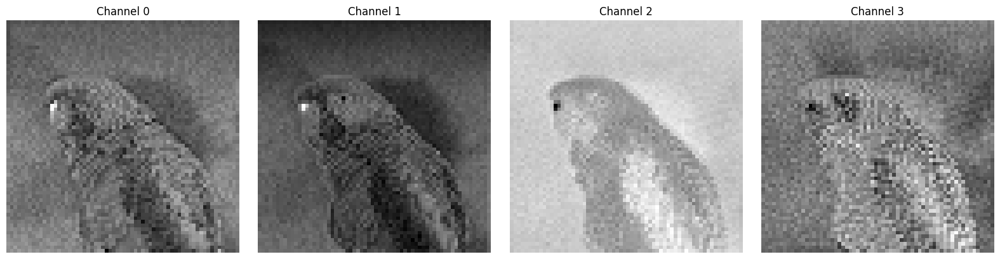

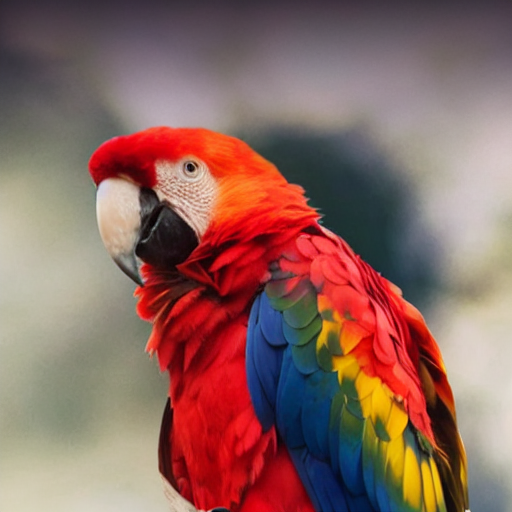

In [ ]:
import matplotlib.pyplot as plt
import torch
from PIL import Image
from IPython.display import display

# 1. Download a demo Image
!curl --output macaw.jpg 'https://lafeber.com/pet-birds/wp-content/uploads/2018/06/Scarlet-Macaw-2.jpg'

# 2. Load the image with PIL
# You can also upload your own image and change the filename here
input_image = Image.open('macaw.jpg').resize((512, 512))
display(input_image)

# 3. Encode to the latent space
encoded = pil_to_latent(input_image)

if encoded is not None:
    print(f"Latent shape: {encoded.shape}")

# 4. Visualize the four channels of this latent representation
fig, axes = plt.subplots(1, 4, figsize=(16, 4))

latent_vis = encoded[0].detach().float().cpu()  # (4, H, W)
for c in range(4):
    ax = axes[c]
    ax.imshow(latent_vis[c], cmap="gray")
    ax.set_title(f"Channel {c}")
    ax.axis("off")

plt.tight_layout()
plt.show()

# 5. Decode back into an image
decoded = latents_to_pil(encoded)[0]
display(decoded)


### 4.2. **Reconstruction Analysis**

This `1x4x64x64` tensor captures a vast amount of information about the image; enough that when we feed it through the decoder, we get back something nearly identical to our input.

#### **Why do we use an Autoencoder?**
We *could* perform diffusion in pixel space (where the model takes full images as input), but this is computationally expensive.
* **Pixel Space:** Processing 512x512 images means calculating gradients for 262,144 pixels per step.
* **Latent Space:** Processing 64x64 latents means calculating gradients for only 4,096 pixels (per channel) per step.

**Latent Diffusion** moves the process into this "compressed" space. The representations are information-rich but small enough to be handled easily on consumer hardware. Once the diffusion process generates a new latent representation, the VAE simply expands it back into high-resolution pixels.

## 5. **The Scheduler**

Now we need to talk about adding noise. The scheduler is the component in charge of handling the "pace" of the diffusion process.

1.  **Training:** We add noise to an image according to a specific distribution and ask the model to predict that noise. If we always added a ton of noise, the model wouldn't see enough structure. If we added too little, the model wouldn't learn to recover from random starting points.
2.  **Sampling (Inference):** We start with pure noise and "denoise" over a specific number of steps. The number of steps and the amount of noise ($\sigma$) at each step significantly affect the final result.

For example, the `LMSDiscreteScheduler` used here matches the configuration used to train Stable Diffusion. When we want to generate an image quickly (e.g., in 15 steps instead of 1000), we must configure the scheduler to calculate the appropriate noise levels for those specific steps.

Inference step | Train timestep | Sigma
-----------------------------------------
             0 |            999 | 14.614647
             1 |            927 | 9.682554
             2 |            856 | 6.678018
             3 |            784 | 4.774591
             4 |            713 | 3.522065
             5 |            642 | 2.666632
             6 |            570 | 2.060644
             7 |            499 | 1.615583
             8 |            428 | 1.276834
             9 |            356 | 1.009687
            10 |            285 | 0.791262
            11 |            214 | 0.605550
            12 |            142 | 0.439667
            13 |             71 | 0.278026
            14 |              0 | 0.029168


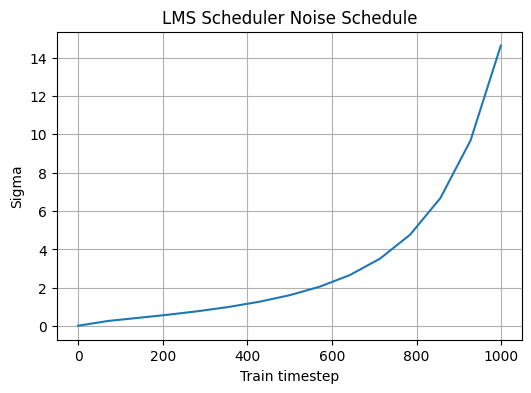

In [ ]:
import matplotlib.pyplot as plt

# 1. Set the number of sampling steps to 15
set_timesteps(scheduler, 15)

# 2. Inspect the schedule
print("Inference step | Train timestep | Sigma")
print("-----------------------------------------")

# Print the step index, the corresponding training timestep, and the sigma value.
for i, (t, sigma) in enumerate(zip(scheduler.timesteps, scheduler.sigmas)):
    print(f"{i:14d} | {int(t.item()):14d} | {sigma.item():.6f}")

# 3. Plot the Schedule
plt.figure(figsize=(6, 4))
plt.plot(scheduler.timesteps.cpu().numpy(), scheduler.sigmas.cpu().numpy()[:len(scheduler.timesteps)])
plt.xlabel("Train timestep")
plt.ylabel("Sigma")
plt.title("LMS Scheduler Noise Schedule")
plt.grid(True)
plt.show()

### 5.1. **Visualizing the Noise**

The `sigma` values you saw above represent the amount of noise added to the latent representation at each step. Let's visualize what the model actually "sees" at a specific step by manually adding noise to our encoded image and then decoding it.

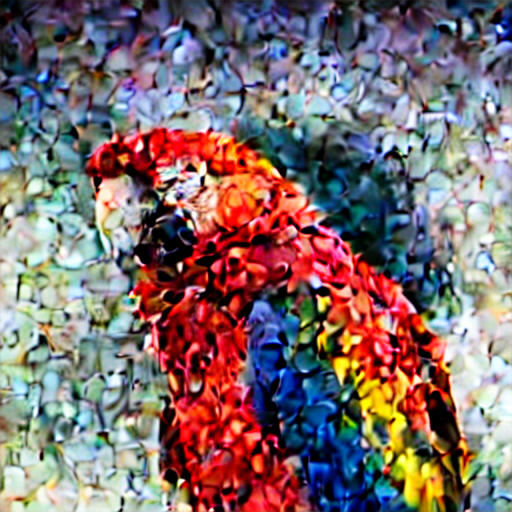

In [ ]:
# Select a specific step (e.g., step 10 out of 15)
sampling_step = 10

noise = torch.randn_like(encoded)

# (scheduler.add_noise expects timesteps as a 1D tensor with batch size)
t = scheduler.timesteps[sampling_step].to(encoded.device)
timesteps = t.expand(encoded.shape[0])  # shape: (batch_size,)
encoded_and_noised = scheduler.add_noise(encoded, noise, timesteps)

# Display the noisy image
if encoded_and_noised is not None:
    display(latents_to_pil(encoded_and_noised.float())[0])


### 5.2. **The Full Progression**

What does the image look like at different stages of the diffusion process?

> **Task:** In the cell below, write a loop to visualize the image at multiple steps (e.g., steps 0, 3, 6, 9, 12, 14).
> * Retrieve the timestep for the chosen step.
> * Add the corresponding amount of noise.
> * Decode and display the result (or use `matplotlib` to show them side-by-side).

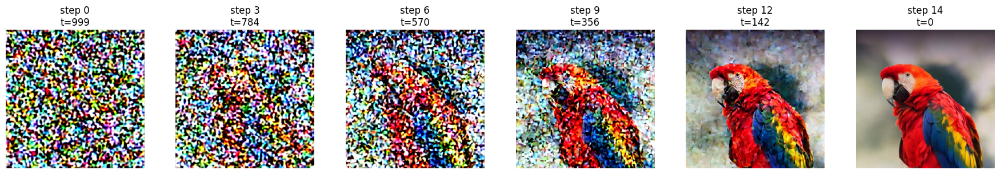

In [ ]:
# Pick a few inference steps to visualize
steps_to_show = [0, 3, 6, 9, 12, 14]

fig, axes = plt.subplots(1, len(steps_to_show), figsize=(3 * len(steps_to_show), 3))

for ax, step in zip(axes, steps_to_show):
    # 1. Get timestep
    t = scheduler.timesteps[step].to(encoded.device)
    timesteps = t.expand(encoded.shape[0])  # (batch_size,)

    # 2. Generate noise and add it using scheduler.add_noise
    noise = torch.randn_like(encoded)
    encoded_noised = scheduler.add_noise(encoded, noise, timesteps)

    # 3. Decode to image
    img = latents_to_pil(encoded_noised.float())[0]

    # 4. Plot using ax.imshow()
    ax.imshow(img)
    ax.set_title(f"step {step}\nt={int(t.item())}")
    ax.axis("off")

plt.tight_layout()
plt.show()


#### **A Note on Scheduler Types**

Other diffusion models may be trained with different noising approaches:
* **Variance Preserving:** Keeps the variance fairly constant across noise levels using scaling tricks.
* **Variance Exploding:** The latents simply have higher and higher variance as more noise is added (like the one we used above).

If we want to start sampling from random noise (instead of a noised image), we typically generate random noise and scale it by the initial sigma value ($\sigma_{max} \approx 14$ in this case). Additionally, before these noisy latents are fed to the UNet, they are scaled again in a **pre-conditioning step**:

$$\text{input} = \frac{\text{input}}{\sqrt{\sigma^2 + 1}}$$

In modern `diffusers` versions, this is handled automatically by `scheduler.scale_model_input(latent_model_input, t)`. Keep this in mind if you work with different model architectures!

## 6. **Image-to-Image (Img2Img)**

Let's see what happens when we use our existing image as a starting point, add some noise to it, and then perform the final few denoising steps with a **new prompt**.

This process is known as **Image-to-Image (Img2Img)**.
* Instead of starting with pure random noise (which generates a completely new image), we start with a "noisy" version of an existing image.
* We skip the first $N$ steps of the denoising process.
* The model then refines this noisy image based on the new text prompt, preserving the general structure and colors of the original while changing the content.

We will use a loop similar to the first demo, but with one key difference: we skip the first `start_step` steps.

  0%|          | 0/15 [00:00<?, ?it/s]

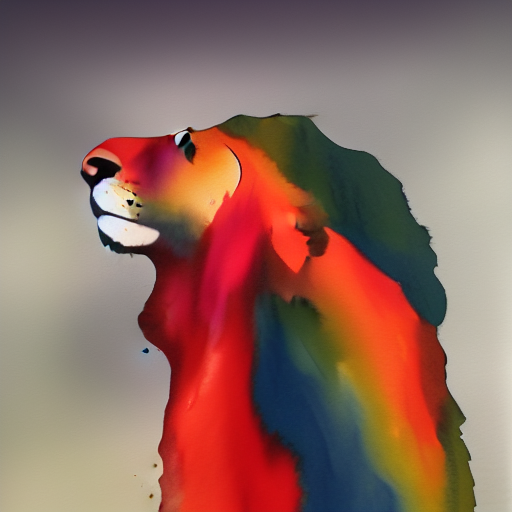

In [ ]:
from torch.cuda.amp import autocast
from tqdm.auto import tqdm
from PIL import Image
from IPython.display import display
import torch

# 1. Settings
prompt = ["a watercolor painting of a tropical lion, soft colors"]  
height = 512
width = 512
num_inference_steps = 15          
guidance_scale = 7.5              
start_step = 5                    
batch_size = 1

# Generator for reproducibility
generator = torch.manual_seed(32)

# 2. Prep text (same as before)
text_inputs = tokenizer(
    prompt,
    padding="max_length",
    max_length=tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)
text_input_ids = text_inputs.input_ids.to(torch_device)
cond_embeddings = text_encoder(text_input_ids)[0]

uncond_inputs = tokenizer(
    [""] * batch_size,
    padding="max_length",
    max_length=tokenizer.model_max_length,
    return_tensors="pt",
)
uncond_input_ids = uncond_inputs.input_ids.to(torch_device)
uncond_embeddings = text_encoder(uncond_input_ids)[0]

# Keep variable name (structure preserved)
text_embeddings = None

# 3. Prep Scheduler
set_timesteps(scheduler, num_inference_steps)

# 4. Prep latents
noise = torch.randn_like(encoded)

t_start = scheduler.timesteps[start_step].to(encoded.device)
timesteps = t_start.expand(encoded.shape[0])

latents = scheduler.add_noise(encoded, noise, timesteps)

# 5. The Loop
with torch.no_grad():
    with autocast():
        for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
            # CRITICAL: We only want to run the denoising steps if i >= start_step!
            if i >= start_step:
                # 1. Expand latents for guidance
                latent_model_input = latents

                # 2. Scale model input
                latent_model_input = scheduler.scale_model_input(latent_model_input, t)

                # 3. Predict noise residual
                if guidance_scale is not None and guidance_scale > 1.0:
                    noise_pred_uncond = unet(
                        latent_model_input, t, encoder_hidden_states=uncond_embeddings
                    ).sample
                    noise_pred_text = unet(
                        latent_model_input, t, encoder_hidden_states=cond_embeddings
                    ).sample
                    noise_pred = noise_pred_uncond + guidance_scale * (
                        noise_pred_text - noise_pred_uncond
                    )
                else:
                    noise_pred = unet(
                        latent_model_input, t, encoder_hidden_states=cond_embeddings
                    ).sample

                # 4. Perform guidance
                # (handled above in a memory-friendly way)

                # 5. Step with scheduler
                latents = scheduler.step(noise_pred, t, latents).prev_sample

# 6. Decode and Display
latents = latents / vae.config.scaling_factor
image = vae.decode(latents).sample

image = (image / 2 + 0.5).clamp(0, 1)
image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
image = (image * 255).round().astype("uint8")[0]

display(Image.fromarray(image))


### 6.1. **Analysis and Experiments**

You should see that some colors and structure from the original image are preserved, but the content has shifted towards our new prompt!

> **Theoretical Insight:** This demonstrates that the diffusion model generates the coarse structure of the image (composition, color blocks) in the early steps (high noise) and the fine details in the later steps (low noise). By skipping the early steps and providing a "noisy" version of an existing image, we force the model to respect the existing structure while refining the details to match the new text.

#### **Experiments**

1. **Vary `start_step`:**  
   When `start_step` is **small** (e.g., 5), we skip only a few early denoising steps. The latents are still relatively close to the original image, so the final output preserves much of the original structure, colors, and layout. The new prompt mainly affects **fine details and style**.  

   As `start_step` increases (e.g., 20), we skip more of the early denoising process. The image becomes **less constrained** by the original input, and the model has more freedom to reshape larger structures. The result is a stronger influence from the text prompt, while some coarse color information or silhouettes may still remain.  

   With a **large `start_step`** (e.g., 40), most of the early structure-defining steps are skipped. The noisy latents are much closer to pure noise, so the output increasingly resembles a **text-to-image generation** rather than an image edit. The original image contributes very little beyond weak color hints, if any.  

   **Theoretical explanation:** Early diffusion steps control global composition and low-frequency structure. Skipping them removes the model’s ability to rewrite those aspects, forcing it to keep (or discard) structure depending on how noisy the starting point is.

2. **Noise Level:**  
   Manually adding more noise before starting the denoising loop increases the **randomness** of the starting latents. This can partially destroy spatial structure even if `start_step` is kept small. As a result, the output may lose recognizable shapes from the original image and become less stable or more chaotic.  

   This differs from simply increasing `start_step` because:
   - Changing `start_step` selects a **specific noise level from the scheduler**, which follows the noise distribution the model was trained on.
   - Manually adding noise can introduce **off-distribution perturbations**, breaking structure in a way the model does not fully expect.  

   In practice, adjusting `start_step` is the **principled and stable** way to control how much of the original image is preserved, while manually adding noise is a more aggressive and less predictable modification.

**Summary:**  
- `start_step` controls *how much structure is preserved vs. regenerated* in a theoretically grounded way.  
- Manual noise injection increases randomness but can reduce coherence.  
- Img2Img works because diffusion models encode global structure early and refine details late.


## 7. **The Text $\rightarrow$ Embedding Pipeline**

![transformer diagram](https://github.com/johnowhitaker/tglcourse/raw/main/images/text_encoder_noborder.png)

To condition the diffusion model on text, we need to convert a string prompt into a set of **embeddings**. This process involves several steps:
1.  **Tokenization:** Splitting the text into tokens (IDs).
2.  **Token Embedding:** Mapping each token ID to a dense vector (size 768).
3.  **Positional Embedding:** Adding vectors that represent the position of each token in the sequence.
4.  **Transformer:** Processing these inputs through the CLIP Text Encoder to get the final contextualized embeddings.

Let's dissect this pipeline and learn how to hijack it to perform tricks like token mixing.

In [ ]:
# Our text prompt
prompt = 'A picture of a puppy'

# 1. Tokenization
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)

# 2. Access the Embedding Layers
token_emb_layer = text_encoder.text_model.embeddings.token_embedding
pos_emb_layer = text_encoder.text_model.embeddings.position_embedding

# 3. Get Token and Positional Embeddings
token_embeddings = token_emb_layer(input_ids)

position_ids = text_encoder.text_model.embeddings.position_ids[:, :77]
position_embeddings = pos_emb_layer(position_ids)

# 4. Combine them
input_embeddings = token_embeddings + position_embeddings

# 5. Helper function for the Transformer Pass
def get_output_embeds(input_embeddings):
    # Use: text_encoder.text_model.encoder(...)

    # We pass None for attention_mask; CLIPEncoder usually defaults to full causal masking
    # if no specific mask is provided, or we rely on the internal defaulting.
    encoder_outputs = text_encoder.text_model.encoder(
        inputs_embeds=input_embeddings
    )

    last_hidden_state = encoder_outputs[0]

    final_output = text_encoder.text_model.final_layer_norm(last_hidden_state)

    return final_output

# Test the function
if input_embeddings is not None:
    output_embeddings = get_output_embeds(input_embeddings)
    print("Output Embeddings Shape:", output_embeddings.shape)

Output Embeddings Shape: torch.Size([1, 77, 768])


### 7.1. **Hacking the Embeddings: Concept Mixing**

Now that we have manual control over the pipeline, we can replace or mix embeddings directly. In this exercise, you will create a "hybrid" creature by mixing the token embeddings of two different animals (e.g., a puppy and a skunk) before generating the image.

In [24]:
def generate_with_embs(text_embeddings):
    """
    A helper function to generate an image from a specific set of text embeddings.
    """
    # Default settings
    height = 512
    width = 512
    num_inference_steps = 30
    guidance_scale = 7.5
    batch_size = 1
    generator = torch.manual_seed(32)

    # 1. Prepare Unconditional Embeddings
    # Generate unconditional embeddings (empty text) for classifier-free guidance.
    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer(
        [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    # We allow this to generate however it wants (Float or Half)
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

    # Concatenate them with the provided 'text_embeddings' argument.
    # CRITICAL FIX: Ensure uncond_embeddings matches the dtype of the incoming text_embeddings
    uncond_embeddings = uncond_embeddings.to(dtype=text_embeddings.dtype, device=torch_device)

    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

    # FINAL SAFEGUARD: Ensure everything going into UNet matches the UNet's expected type
    text_embeddings = text_embeddings.to(dtype=unet.dtype)

    # 2. Setup Scheduler & Latents
    scheduler.set_timesteps(num_inference_steps)

    latents = torch.randn(
        (batch_size, unet.in_channels, height // 8, width // 8),
        generator=generator,
    ).to(device=torch_device, dtype=unet.dtype) # Ensure latents are also the correct type

    latents = latents * scheduler.init_noise_sigma

    # 3. The Denoising Loop
    for t in tqdm(scheduler.timesteps):
        # expand the latents if we are doing classifier-free guidance
        latent_model_input = torch.cat([latents] * 2)
        latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        # compute the previous noisy sample x_t -> x_t-1
        latents = scheduler.step(noise_pred, t, latents).prev_sample

    # 4. Decode
    latents = 1 / 0.18215 * latents
    with torch.no_grad():
        image = vae.decode(latents).sample

    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).round().astype("uint8")
    pil_image = Image.fromarray(image[0])

    return pil_image

  0%|          | 0/30 [00:00<?, ?it/s]

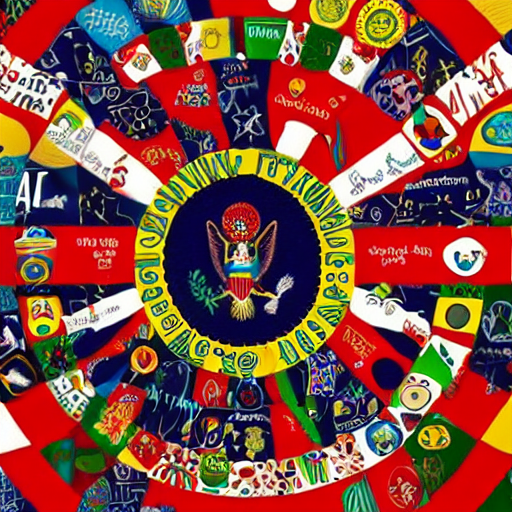

In [ ]:
prompt = 'A picture of a puppy'
target_token_id = 6829  # Token ID for "puppy"

# 1. Tokenize original prompt
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
input_ids = text_input.input_ids.to(torch_device)
token_embeddings = token_emb_layer(input_ids)

# 2. Create the mixed embedding
puppy_id = torch.tensor([6829], device=torch_device)
puppy_emb = token_emb_layer(puppy_id)

skunk_id = torch.tensor([42194], device=torch_device)
skunk_emb = token_emb_layer(skunk_id)

# We wrap the math in parentheses and ensure it matches the text_encoder's dtype
mixed_emb = (0.5 * puppy_emb + 0.5 * skunk_emb).to(dtype=text_encoder.dtype)

# 3. Inject into the sequence
indices = (input_ids == target_token_id).nonzero(as_tuple=True)
token_embeddings[indices] = mixed_emb

# 4. Generate
# We must re-add the positional embeddings to our modified token embeddings
position_ids = text_encoder.text_model.embeddings.position_ids[:, :77]
position_embeddings = pos_emb_layer(position_ids)

input_embeddings = token_embeddings + position_embeddings

# Run through the transformer
modified_output_embeddings = get_output_embeds(input_embeddings)

# FIX: Explicitly cast the final embeddings to match the UNet's expected dtype (Float16)
# This prevents the "Float and Half" mismatch error.
modified_output_embeddings = modified_output_embeddings.to(dtype=unet.dtype)

display(generate_with_embs(modified_output_embeddings))

### 7.2. **Chimera via Prompt Averaging**

Instead of mixing single tokens, what if we average the **entire** embedding sequence of two different prompts?

  0%|          | 0/30 [00:00<?, ?it/s]

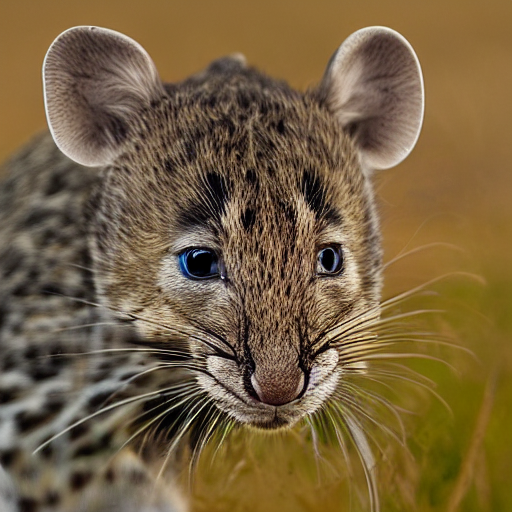

In [ ]:

# Define the two prompts
prompt_a = "A mouse"
prompt_b = "A leopard"

# 1. Helper function to get final embeddings from the standard text encoder
def get_final_embeddings(prompt):
    # Tokenize
    text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
    # Pass through the full text encoder
    with torch.no_grad():
        text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
    return text_embeddings

# 2. Get embeddings for both prompts
embeddings_a = get_final_embeddings(prompt_a)
embeddings_b = get_final_embeddings(prompt_b)

# 3. Average the final embeddings
# This averages the contextualized representation of the entire sentences.
mixed_embeddings = (embeddings_a + embeddings_b) / 2.0

# Ensure dtype is correct before passing to generator (safeguard)
mixed_embeddings = mixed_embeddings.to(dtype=text_encoder.dtype)

# 4. Generate and display
display(generate_with_embs(mixed_embeddings))

## 8. **The UNet and Classifier-Free Guidance (CFG)**

The UNet is the core "brain" of the diffusion model. It takes in:
1.  **Noisy Latents ($x_t$):** The image data containing noise.
2.  **Timestep ($t$):** Telling the model how much noise is present.
3.  **Text Embeddings:** The conditioning information (what to generate).

It outputs a prediction of the **noise** present in the latents.

We can inspect the inputs and outputs directly:

In [ ]:
# 1. Prep Scheduler
num_inference_steps = 30
scheduler.set_timesteps(num_inference_steps)

# Get the first timestep
t = scheduler.timesteps[0]

# 2. Prep Latents
batch_size = 1
height = 512
width = 512

# FIX: Generate on CPU first to avoid "generator device mismatch"
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=torch.manual_seed(32),
    device="cpu", # Generate on CPU
)

# Move to GPU and cast to correct dtype (Float16)
latents = latents.to(device=torch_device, dtype=unet.dtype)

latents = latents * scheduler.init_noise_sigma

# 3. Prep Text Embedding
prompt = "A macaw"
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

# 4. Run the UNet
# Hint: unet(latents, t, encoder_hidden_states=text_embeddings)["sample"]
with torch.no_grad():
    noise_pred = unet(latents, t, encoder_hidden_states=text_embeddings).sample

# Check shapes
if latents is not None and noise_pred is not None:
    print(f"Latents shape: {latents.shape}")
    print(f"Noise Pred shape: {noise_pred.shape}")

Latents shape: torch.Size([1, 4, 64, 64])
Noise Pred shape: torch.Size([1, 4, 64, 64])


### 8.1. **Visualizing the Denoising Process**

The model predicts the noise, which we can subtract to estimate the clean image ($x_0$).
* **Predicted $x_0$:** The model's current "best guess" of the final image (removing all predicted noise).
* **Next Step $x_{t-1}$:** The noisy latent for the next step (removing *some* noise).

Let's visualize this process by saving both the "Next Step" (noisy) and "Predicted $x_0$" (clean) at every iteration and compiling them into a video.

In [ ]:
prompt = 'Oil painting of an otter in a top hat'
height = 512
width = 512
num_inference_steps = 50
guidance_scale = 8
generator = torch.manual_seed(32)
batch_size = 1

# Setup directories for saving frames
!rm -rf steps/
!mkdir -p steps/

# 1. Prep Text & Unconditional Embeddings
text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# 2. Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# 3. Prep Latents
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
    device="cpu"  # Generate on CPU to match seed
).to(torch_device, dtype=unet.dtype)
latents = latents * scheduler.init_noise_sigma

# Helper to decode latents to PIL
def decode_to_pil(latents):
    latents = 1 / 0.18215 * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).round().astype("uint8")
    return Image.fromarray(image[0])

# 4. Loop
for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
    latent_model_input = torch.cat([latents] * 2)
    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # 5. Step and Visualize
    # Use scheduler.step to get the previous sample and the predicted original sample
    scheduler_step = scheduler.step(noise_pred, t, latents)

    # The clean image prediction (x0)
    # Note: Not all schedulers return pred_original_sample by default, but standard LMS/Euler usually do.
    latents_x0 = scheduler_step.pred_original_sample

    # The next noisy latent (x_t-1)
    latents = scheduler_step.prev_sample

    im_t0 = decode_to_pil(latents_x0)
    im_next = decode_to_pil(latents)

    # Combine and save
    im = Image.new('RGB', (1024, 512))
    im.paste(im_next, (0, 0))   # Left: Noisy Step
    im.paste(im_t0, (512, 0))   # Right: Predicted Clean
    im.save(f'steps/{i:04}.jpeg')

print("Done! Check the 'steps/' folder.")

  0%|          | 0/50 [00:00<?, ?it/s]

Done! Check the 'steps/' folder.


### 8.2. **Video: Denoising in Action**

We can now compile these frames into a video.
* **Left:** The noisy state ($x_t$) gradually clearing up.
* **Right:** The model's "imagined" final result ($x_0$) at that specific step. Notice how the concept stabilizes over time!

In [30]:
# Create video using ffmpeg (change width to 1024 for full res if you want)
!ffmpeg -v 1 -y -f image2 -framerate 12 -i steps/%04d.jpeg -c:v libx264 -preset slow -qp 18 -pix_fmt yuv420p out.mp4

# Display video
mp4 = open('out.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=600 controls>
      <source src="{data_url}" type="video/mp4">
</video>
""")

## 9. **Additional Guidance: Loss-Based Control**

Finally, let's explore how to add extra control to the generation process beyond just the text prompt.

At each step of the diffusion loop, we have a "current guess" of the image. We can apply a **loss function** to this intermediate image to measure how well it satisfies a specific property (e.g., "how blue is it?"). We then calculate the gradient of this loss with respect to the latents and adjust them to minimize the loss.

**The Strategy:**
1.  Predict the clean image ($x_0$) from the current noisy latents.
2.  Decode it to pixel space (differentiably!).
3.  Calculate a loss (e.g., punishing non-blue pixels).
4.  Compute gradients and update the latents to reduce this loss.

Let's try a simple example: **The Blue Loss**. We will force the model to generate an image with a lot of blue, even if the prompt implies otherwise (e.g., "A campfire").

In [32]:
def blue_loss(images):
    """
    Calculates the mean absolute error between the blue channel and a target value of 0.9.
    Args:
        images: Tensor of shape (B, C, H, W) in range [0, 1]
    """
    # [:, 2] selects the blue channel (assuming RGB)
    error = torch.abs(images[:, 2] - 0.9).mean()
    return error

  0%|          | 0/50 [00:00<?, ?it/s]

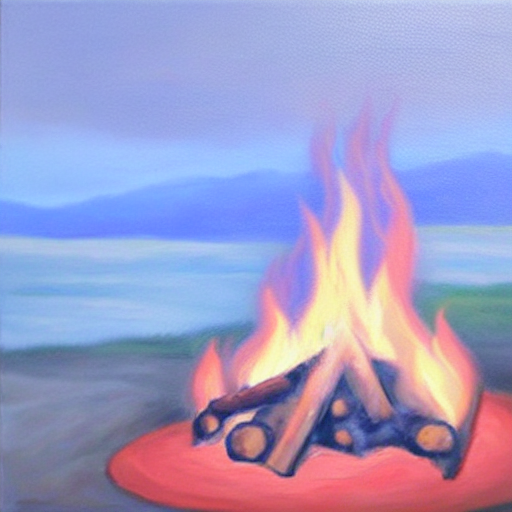

In [ ]:
prompt = 'A campfire (oil on canvas)'
height = 512
width = 512
num_inference_steps = 50
guidance_scale = 8
blue_loss_scale = 200  # Strength of the blue guidance
batch_size = 1

generator = torch.manual_seed(32)

# 1. Prep Text & Unconditional Embeddings
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
with torch.no_grad():
    uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# 2. Prep Scheduler
scheduler.set_timesteps(num_inference_steps)

# 3. Prep Latents
latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
    device="cpu", # Generate on CPU to match seed behavior
).to(torch_device, dtype=unet.dtype)
latents = latents * scheduler.init_noise_sigma

# 4. Loop
for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):

    # --- PART A: Standard Diffusion Step ---
    latent_model_input = torch.cat([latents] * 2)

    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # --- PART B: Additional Loss-Based Guidance ---
    # We apply this every 5 steps to save compute, and only in the first 80% of steps
    if i % 5 == 0 and i < 40:
        # 1. Enable gradients on latents
        # We work on a detached copy to avoid breaking the scheduler's internal graph
        latents_grad = latents.detach().requires_grad_()

        # 2. Predict x0 (clean image) approximation
        # Formula: x0 = x_t - sigma * noise_pred
        sigma = scheduler.sigmas[i]

        # We must use the 'noise_pred' we just calculated to estimate what the clean image looks like right now
        latents_x0 = latents_grad - sigma * noise_pred.detach()

        # 3. Decode to image space (using VAE)
        # Scale latents (standard SD scaling factor)
        latents_x0 = 1 / 0.18215 * latents_x0

        # Decode using vae.decode(...)
        # CRITICAL: We do NOT use torch.no_grad() here because we need gradients to flow back through the VAE!
        images = vae.decode(latents_x0).sample

        # Normalize result to [0, 1] range (VAE output is approx -1 to 1)
        images = (images / 2 + 0.5).clamp(0, 1)

        # 4. Calculate Loss
        loss = blue_loss(images) * blue_loss_scale

        # 5. Compute Gradient
        cond_grad = torch.autograd.grad(loss, latents_grad)[0]

        # 6. Update Latents
        # Hint: Scale the gradient by sigma^2 for stability.
        # (Updates should be stronger when noise is high, weaker when noise is low)
        latents = latents - cond_grad * (sigma ** 2)

    # --- PART C: Scheduler Step ---
    latents = scheduler.step(noise_pred, t, latents).prev_sample

# Display Result
if latents is not None:
    display(latents_to_pil(latents)[0])

## 10. **Advanced Analysis: Geometry of the Latent Space (LERP vs. SLERP)**

In this final section, we will move beyond simply using the model and analyze the mathematical properties of the latent space we have been working with.

You may have noticed that we typically initialize latents from a standard normal distribution (Gaussian). In high-dimensional spaces (like our $4 \times 64 \times 64$ latent space), points drawn from a standard normal distribution tend to concentrate on a "hypersphere" shell rather than near the origin or uniformly throughout the space.

This has important implications for how we interpolate between two images.
* **Linear Interpolation (LERP):** Moving in a straight line between two points.
* **Spherical Linear Interpolation (SLERP):** Moving along the arc of the hypersphere between two points.

If we LERP between two latents, we might traverse through the "center" of the sphere, where the probability density is low, leading to low-quality or "muddy" images in the middle of the transition. SLERP maintains the magnitude of the vectors, staying on the high-probability manifold.

### 10.1. **The Task**

You are required to:
1.  **Implement SLERP:** Write a function that performs Spherical Linear Interpolation between two tensors.
2.  **Comparison Experiment:** Generate two different images (A and B) using two different random seeds.
3.  **Generate Transitions:** Create a video or a grid of images showing the transition from A to B using LERP and SLERP.
4.  **Analysis:** Answer the questions below.

$$\text{Slerp}(v_0, v_1, t) = \frac{\sin((1-t)\Omega)}{\sin(\Omega)} v_0 + \frac{\sin(t\Omega)}{\sin(\Omega)} v_1$$

Where $\Omega$ is the angle between the vectors: $\cos(\Omega) = \frac{v_0 \cdot v_1}{\|v_0\| \|v_1\|}$.

Generating start and end noise...


  0%|          | 0/5 [00:00<?, ?it/s]

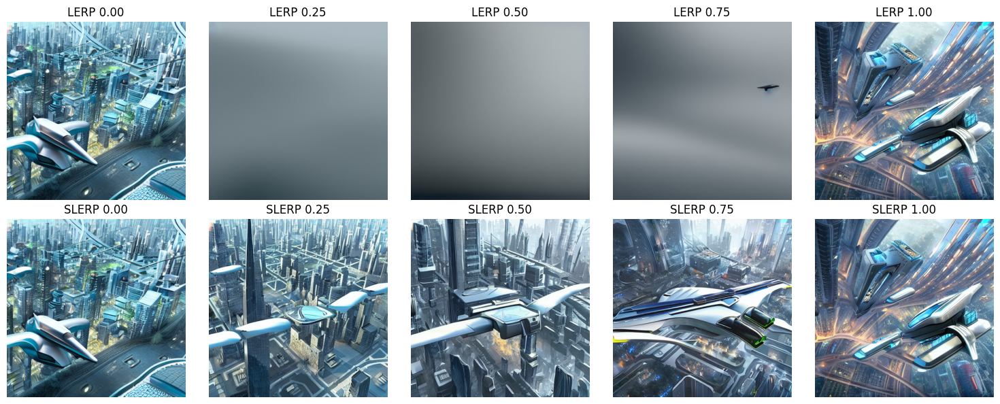

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Implement SLERP
def slerp(val, low, high):
    """
    Spherical Linear Interpolation between 'low' and 'high' tensors based on ratio 'val'.
    """
    # Flatten to vectors for dot product calculation
    low_flat = low.flatten()
    high_flat = high.flatten()

    # Normalize vectors to unit length
    low_norm = low_flat / torch.norm(low_flat)
    high_norm = high_flat / torch.norm(high_flat)

    # Calculate dot product (cosine similarity)
    dot = torch.dot(low_norm, high_norm)

    # Clamp to [-1, 1] to avoid numerical errors
    dot = torch.clamp(dot, -1.0, 1.0)

    # Calculate angle Omega
    omega = torch.acos(dot)
    sin_omega = torch.sin(omega)

    # If vectors are very close, fallback to linear interpolation to avoid division by zero
    if sin_omega < 1e-5:
        return (1.0 - val) * low + val * high

    # Compute coefficients
    coeff0 = torch.sin((1.0 - val) * omega) / sin_omega
    coeff1 = torch.sin(val * omega) / sin_omega

    # Interpolate and return (scaling happens naturally if inputs had same magnitude)
    return coeff0 * low + coeff1 * high

# 2. Experiment Setup
prompt = "A futuristic city with flying cars"
num_inference_steps = 30
guidance_scale = 7.5

# Helper to run the diffusion loop on a specific noise tensor
def run_diffusion(noise):
    # Setup standard embeddings (re-using previous variables if available)
    text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
    with torch.no_grad():
        text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

    uncond_input = tokenizer([""], padding="max_length", max_length=text_input.input_ids.shape[-1], return_tensors="pt")
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

    # Combine embeddings
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

    # Setup Latents
    scheduler.set_timesteps(num_inference_steps)
    latents = noise * scheduler.init_noise_sigma

    # Loop
    for t in scheduler.timesteps:
        latent_model_input = torch.cat([latents] * 2)
        latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        latents = scheduler.step(noise_pred, t, latents).prev_sample

    return latents

# Helper to decode latents to image
def decode_img(latents):
    latents = 1 / 0.18215 * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    return Image.fromarray((image[0] * 255).round().astype("uint8"))

# Generate Initial Noise for A and B
print("Generating start and end noise...")
noise_a = torch.randn((1, unet.in_channels, 64, 64), generator=torch.manual_seed(42), device="cpu").to(torch_device, dtype=unet.dtype)
noise_b = torch.randn((1, unet.in_channels, 64, 64), generator=torch.manual_seed(100), device="cpu").to(torch_device, dtype=unet.dtype)

# 3. Generate Interpolations
# We use 5 frames to save compute time, but you can increase to 10
ratios = np.linspace(0, 1, 5)
lerp_images = []
slerp_images = []

for r in tqdm(ratios):
    # LERP: Linear interpolation on noise
    noise_lerp = (1 - r) * noise_a + r * noise_b
    latents_lerp = run_diffusion(noise_lerp)
    lerp_images.append(decode_img(latents_lerp))

    # SLERP: Spherical interpolation on noise
    noise_slerp = slerp(r, noise_a, noise_b)
    latents_slerp = run_diffusion(noise_slerp)
    slerp_images.append(decode_img(latents_slerp))

# 4. Visualization
fig, axs = plt.subplots(2, len(ratios), figsize=(15, 6))

for i, r in enumerate(ratios):
    # Top Row: LERP
    axs[0, i].imshow(lerp_images[i])
    axs[0, i].set_title(f"LERP {r:.2f}")
    axs[0, i].axis('off')

    # Bottom Row: SLERP
    axs[1, i].imshow(slerp_images[i])
    axs[1, i].set_title(f"SLERP {r:.2f}")
    axs[1, i].axis('off')

plt.tight_layout()
plt.show()

### 10.2. **Analysis**

**Theoretical Analysis**

> In high-dimensional spaces, Gaussian random vectors (like our latents) tend to concentrate on the surface of a hypersphere (the "soap bubble" effect). All valid latents have roughly the same magnitude (distance from the origin).
>
> **LERP** calculates a straight line (chord) between two points on this sphere. This line cuts through the interior of the sphere, where the magnitude (norm) is significantly smaller. Because the diffusion model expects inputs with unit variance (magnitude ~1), these "short" vectors in the middle are interpreted as having low signal energy, resulting in weak, gray outputs.
>
> **SLERP** follows the arc (geodesic) along the surface of the sphere. It ensures that every interpolated point maintains the correct magnitude, preserving the variance and "energy" that the UNet expects.


**Visual Observation**

> * **LERP:** The middle images (0.25, 0.50, 0.75) show a catastrophic loss of contrast. The image at 0.50 is almost completely a flat gray square, looking like "mud" or fog. The model failed to generate any meaningful structure because the input noise variance was too low.
> * **SLERP:** The transition is smooth and consistently sharp. The image at 0.50 is vibrant, high-contrast, and clearly structured (showing a distinct building/ship hybrid). It looks like a valid image from the model's distribution, successfully blending the features of the start and end images without washing out.


**The Norm**


> * **LERP Norm:** If we plotted this, we would see a "U" shape or a dip in the middle. At $t=0.5$, the norm drops significantly (typically to about $\approx 0.7$ or $1/\sqrt{2}$ if the vectors are orthogonal).
> * **SLERP Norm:** The norm stays constant (a flat line) throughout the interpolation.
> * **Relation:** The dip in the LERP norm corresponds exactly to the gray images observed in Q2. The "magnitude" of the latent vector essentially controls the contrast/variance of the generation. When the norm dips, the variance drops, and the image turns gray.